In [2]:
%pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-snqc2r82
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-snqc2r82
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 205.2 kB/s eta 0:00:00a 0:00:01
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369491 sha256=65a5327598fa5e1e4b428d9b6f6847270fda1f77e2a8a9663745e60a37fb9d54
  Stored in directory: /tmp/pip-ephem-wheel-cache-fxcpxb92/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# Code

In [3]:
import clip
import torch
import requests
import numpy as np
import torchvision
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import draw_bounding_boxes

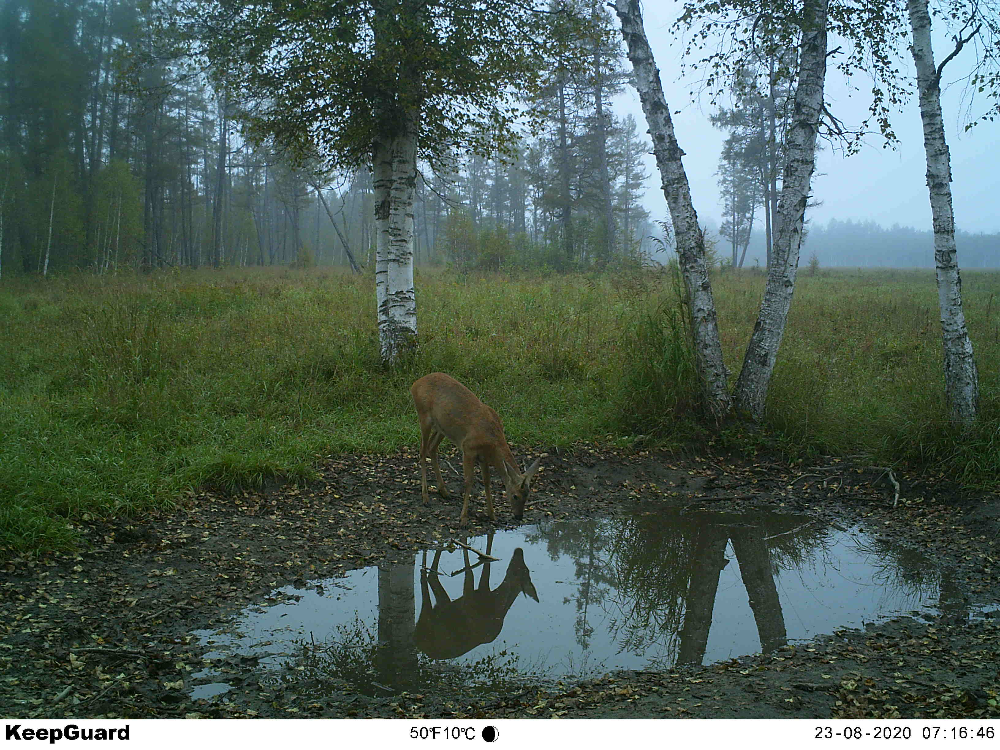

In [4]:
img = Image.open("/home/adil/Projects/grozny-hack/Hack_2024-main/data/PICT1709.JPG").convert("RGB")
img

In [5]:
faster_rcnn = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
faster_rcnn.eval()

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /home/adil/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 160M/160M [02:41<00:00, 1.03MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [6]:
transform = transforms.ToTensor()
img_tensor = transform(img)
# pass the image through the model


transformed = faster_rcnn.transform([img_tensor])[0]
features = faster_rcnn.backbone(transformed.tensors)
boxes = faster_rcnn.rpn(transformed, features)[0][0]

second_boxes = faster_rcnn(img_tensor.unsqueeze(0))[0]['boxes'].detach()
print(boxes.shape)

torch.Size([1000, 4])


In [7]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def plot_image_with_boxes(image, boxes, labels=None):
    fig, ax = plt.subplots(1)
    ax.imshow(transforms.ToPILImage()(image))
    for i, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, fill=False, edgecolor='green')
        ax.add_patch(rect)
        if labels is not None:
            label_size = len(labels) * 10
            ax.text(x_min + (x_max - x_min) / 2 - label_size / 2, y_min, labels[i], fontsize=10, verticalalignment='top', color='black')

    plt.tight_layout()
    plt.axis('off')
    plt.show()

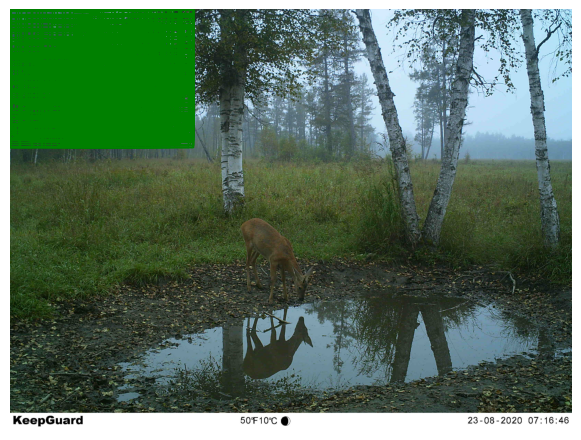

In [8]:
plot_image_with_boxes(img_tensor, boxes)

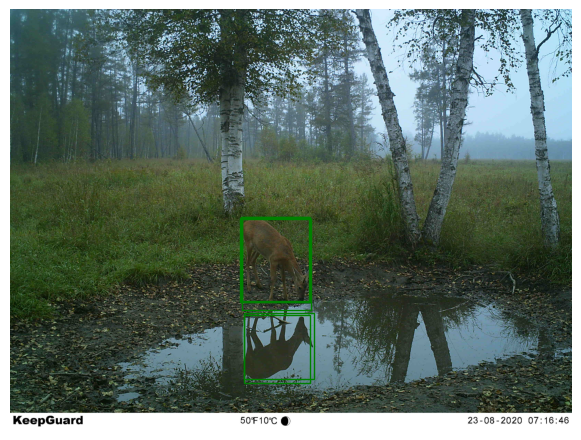

In [9]:
plot_image_with_boxes(img_tensor, second_boxes)

## Using CLIP

In [10]:
ch , height, width = img_tensor.shape
print(f'{height=}, {width=}')

height=2448, width=3264


In [11]:
def get_coordinates_of_object_from_query(model, preprocessor, query, img_tensor, boxes, width=width, height=height):
    max_similarity = -np.inf
    max_rel_box = None
    model.eval()
    for box in boxes:
        x_min, y_min , x_max, y_max = box
        x_min, y_min , x_max, y_max = int(x_min.item()), int(y_min.item()), min(width, int(x_max.item())), min(height, int(y_max.item()))

        if x_min > x_max or x_min > width:
            continue

        if y_min > y_max or y_min > height:
            continue

        cropped_image = img_tensor[:,y_min:y_max+1,x_min:x_max+1]
        if not torch.prod(torch.tensor(cropped_image.shape)):
            continue

        cropped_image = preprocessor(transforms.functional.to_pil_image(cropped_image)).unsqueeze(0).to(device)
        tokenized_query = clip.tokenize(query).to(device)

        image_emb = model.encode_image(cropped_image)
        text_emb = model.encode_text(tokenized_query)
        image_emb = F.normalize(image_emb, p=2, dim=-1)
        text_emb = text_emb.mean(dim=0, keepdim=True)
        text_emb = F.normalize(text_emb, p=2, dim=-1)

        similarity = torch.dot(image_emb.view(-1), text_emb.view(-1))
        if similarity > max_similarity:
            max_similarity = similarity
            max_rel_box = box
    return max_rel_box.cpu().numpy()

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# clip_model, preprocessor = clip.load("ViT-B/32", device=device)
clip_model, preprocessor = clip.load("ViT-B/16", device=device)

100%|████████████████████████████████████████| 335M/335M [14:27<00:00, 405kiB/s]


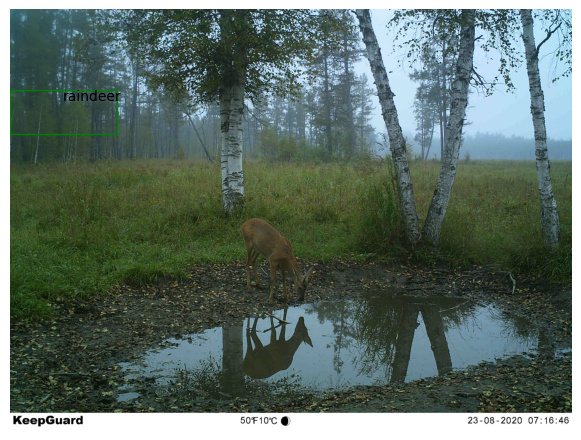

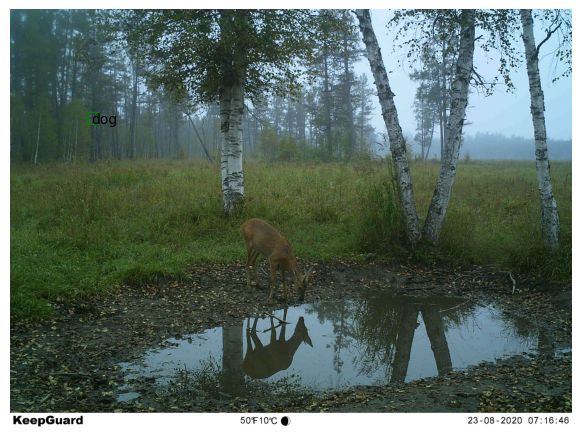

In [14]:
queries = [
    [
        'a raindeer',
        'a brown deer',
        'a brown raindeer eats grass',
        'a raindeer curiosly walks'
    ]
    ,
    [
        'a dog',
        'a dog runs',
        'a fat dog lays on ground'
    ]
]

labels = ['raindeer', 'dog']

all_boxes = []
for query, label in zip(queries, labels):
    pred_box = get_coordinates_of_object_from_query(clip_model, preprocessor, query, img_tensor, boxes, width, height)
    all_boxes.append(pred_box)
    plot_image_with_boxes(img_tensor, [pred_box], [label])

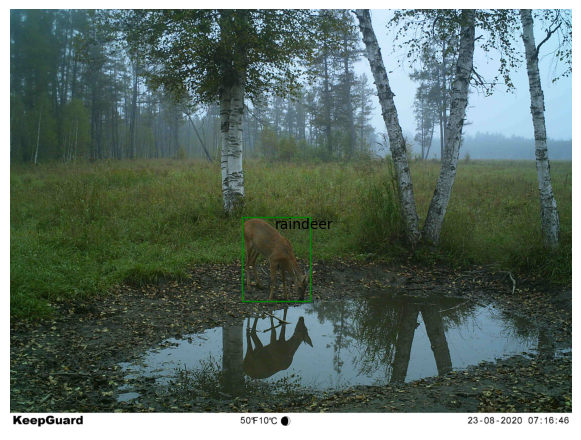

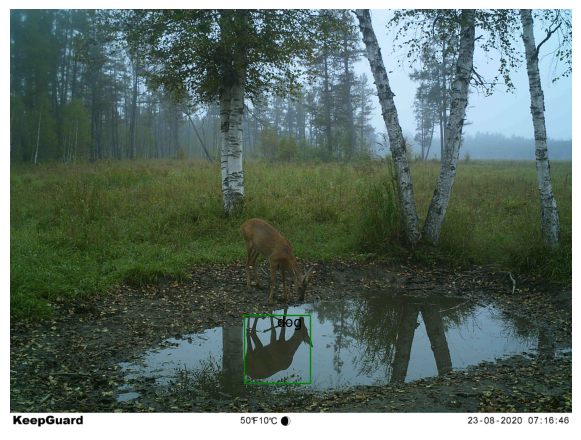

In [15]:
all_boxes = []
for query, label in zip(queries, labels):
    pred_box = get_coordinates_of_object_from_query(clip_model, preprocessor, query, img_tensor, second_boxes, width, height)
    all_boxes.append(pred_box)
    plot_image_with_boxes(img_tensor, [pred_box], [label])